# Unsupervised Clastering

1. The aim of this challenge to apply dimensinality reduction techniques and clastering. In this project I used a dataset scraped from TURO website, the biggest car sharing platform in the USA. The data is unlabeled so we will try. to define is there certain amount of clasters present.
2. First of all we will do data cleaning.
3. Then we wll use K-means, Hierarchical Clustering and DBSCAN. For all of this methods we will try to decrese dimensionality with PSA ans UMAP techinque and will check what will be the siloughette rate for each of the methodics. 

In [1]:
#Import required libraries for the project
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import time
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sqlalchemy import create_engine
import warnings
from scipy.stats.mstats import winsorize
from sklearn.metrics import mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LassoCV, RidgeCV, ElasticNetCV
from statsmodels.tools.eval_measures import mse, rmse
from sklearn.cluster import KMeans
from sklearn import datasets, metrics

/Users/administrator/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
df = pd.read_csv('Turo cars March 1 2018.csv')
df = df[df['Status'] == "Active"]

# Basic data exploration


At this stage we will check the sanity of the data, make observations on the data type, missing values, outliers, shape of the data

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45233 entries, 38 to 168108
Data columns (total 100 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Car ID                               45233 non-null  int64  
 1   URL                                  45233 non-null  object 
 2   Make                                 45233 non-null  object 
 3   Model                                45233 non-null  object 
 4   Trim                                 23387 non-null  object 
 5   Year                                 45233 non-null  int64  
 6   Color                                27235 non-null  object 
 7   Transmission                         45233 non-null  object 
 8   Fuel Type                            37350 non-null  object 
 9   Number of seats                      36540 non-null  float64
 10  Number of doors                      37317 non-null  float64
 11  GPS                      

## Create Target Variable

In [4]:
df['Ut_Mar'] = (df['Occupancy Mar']+2-df['Another Occupancy Mar'])/(30-df['Another Occupancy Mar'])
df['Ut_Mar'] = np.clip(df['Ut_Mar'], a_max=1, a_min=0)
df['Ut_Feb'] = (df['Occupancy Feb ']+2-df['Another Occupancy Feb'])/(31-df['Another Occupancy Feb'])
df['Ut_Feb'] = np.clip(df['Ut_Feb'], a_max=1, a_min=0)
df['Ut_Jan'] = (df['Occupancy Jan']+2-df['Another Occupancy Jan'])/(31-df['Another Occupancy Jan'])
df['Ut_Jan'] = np.clip(df['Ut_Jan'], a_max=1, a_min=0)

In [5]:
col = df.loc[: , "Ut_Mar":"Ut_Jan"]
df['Ut_R'] = col.mean(axis=1)

## 2 . Transform some non numerical to numerical


### 2.1. Custom Delivery variable

In [6]:
df['Custom Delivery fee'].unique ()

array(['20₴', nan, '80₴', 'Free', '50₴', '10₴', '100₴', '120₴', '70₴',
       '30₴', '40₴', '60₴', 'CA$80', '90₴', 'CA$30', '110₴', '$120 ',
       '$60 ', '$50 ', '$90 ', '$20 ', '$70 ', '$30 ', '$80 ', '$100 ',
       '$40 ', '$10 ', '$110 ', 'CA$20', 'CA$10', 'CA$100', 'CA$40',
       'CA$120', 'CA$60', 'CA$50', 'CA$70', '50 р.', '60 р.', '80 р.',
       '30 р.', '100 р.', '120 р.', '20 р.', '40 р.', '70 р.', '10 р.',
       '90 р.', '£50', '£90', '110 р.', '£30', '96.07', '£120', '£40',
       '£100', '8', '16.01', '£80', '16.02', '£60', '£70', '£110',
       '64.09', '£10', '80.01', '£20', 'CA$90', '40.05', '50', '48.05',
       '72.07', '32', '64.06', '96.1', '8.01', '40.1', '40.02', '32.03',
       '96.02', '48.02', '24.03', '10', '20', '30', '60', '40', '120',
       '70', '100', '80'], dtype=object)

In [7]:
import pandas as pd
def remove_whitespace(x):
    try:
        # remove spaces inside and outside of string
        x = "".join(x.split())
    except:
        pass
    return x
df['Custom Delivery fee'] = df['Custom Delivery fee'].apply(remove_whitespace)

In [8]:
df['Custom Delivery fee'] = df['Custom Delivery fee'].astype(str)

In [9]:

df['Custom Delivery fee'] = df['Custom Delivery fee'].apply(lambda x: x.replace ('CA', ''))
df['Custom Delivery fee'] = df['Custom Delivery fee'].apply(lambda x: x.replace ('$', ''))
df['Custom Delivery fee'] = df['Custom Delivery fee'].apply(lambda x: x.replace ('£', ''))
df['Custom Delivery fee'] = df['Custom Delivery fee'].apply(lambda x: x.replace ('₴', ''))
df['Custom Delivery fee'] = df['Custom Delivery fee'].apply(lambda x: x.replace ('р.', ''))

In [10]:
df['Custom Delivery fee'].unique ()

array(['20', 'nan', '80', 'Free', '50', '10', '100', '120', '70', '30',
       '40', '60', '90', '110', '96.07', '8', '16.01', '16.02', '64.09',
       '80.01', '40.05', '48.05', '72.07', '32', '64.06', '96.1', '8.01',
       '40.1', '40.02', '32.03', '96.02', '48.02', '24.03'], dtype=object)


Create Categories for the delivery - 
- 1 - don't do delivery
- 2 - Free DELIVERY
- 3 - paid delivery from 1-50
- 4 - paid delivery from 51-120

In [11]:
#Replace nan with 0
df['Custom Delivery fee'] = df['Custom Delivery fee'].fillna(0)
#Replace "Free with 1"
df['Custom Delivery fee'] = df['Custom Delivery fee'].apply( lambda x: x.replace ('Free', '1' ))

In [12]:
#convert variable to numeric
df['Custom Delivery fee'] = df['Custom Delivery fee'].astype(float)

In [13]:

def cat_delivery (del_cost):
    if del_cost == 0:
        return 1
    if del_cost == 1:
        return 2
    if del_cost<50:
        return 3
    else:
        return 4

In [14]:



# we use Pandas' .apply() method by calling the function above.
df['Delivery Group'] = df['Custom Delivery fee'].apply(cat_delivery)

In [15]:


# let's see how many observations we have in each group
print(df.groupby('Delivery Group')["Custom Delivery fee"].count())

Delivery Group
2    4955
3    7667
4    8910
Name: Custom Delivery fee, dtype: int64


### 2.1 Airport Delivery variable

In [16]:
df['regularAirportDeliveryFee'].unique()

array(['30₴', nan, 'Up to $80', '60₴', '10₴', '120₴', '70₴', '20₴',
       'Up to $100', '40₴', 'Up to $30', '50₴', 'Up to $120', 'Free',
       '90₴', '100₴', 'Up to $40', 'Up to $50', 'Up to CA$100',
       'Up to $70', '80₴', 'Up to $60', 'Up to $90', 'Up to $110',
       'Up to $20', '$120 ', '$100 ', '$20 ', '$30 ', '$40 ', '$50 ',
       '$60 ', '$70 ', '$90 ', '$80 ', '$10 ', '$110 ', 'CA$30', 'CA$100',
       'CA$50', 'CA$10', 'Up to CA$120', 'Up to CA$40', 'CA$40', 'CA$80',
       'CA$60', 'CA$120', 'Up to CA$30', 'Up to CA$70', 'CA$70',
       'Up to CA$80', 'Up to $10', '20 р.', '100 р.', '40 р.', '50 р.',
       '30 р.', '70 р.', '60 р.', '120 р.', '£30', '110 р.', '90 р.',
       '80 р.', '10 р.', '£60', 'CA$20', 'Up to CA$50', 'Up to €120',
       'CA$90', 'Up to CA$60', 'Up to £100', 'Up to £60', 'CA$110', '10',
       'Up to £40', '20', '50', 'Up to €60', '70', '30', '120', '60',
       '90', '100'], dtype=object)

In [17]:
import pandas as pd
def remove_whitespace(x):
    try:
        # remove spaces inside and outside of string
        x = "".join(x.split())
    except:
        pass
    return x
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply(remove_whitespace)

In [18]:
#clean data
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].astype(str)
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('CA', ''))
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('€', ''))
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('Upto', ''))
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('$', ''))
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('£', ''))
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('₴', ''))
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('р.',''))

Create Categories for the delivery 
- 1- don't do delivery 
- 2- Free DELIVERY 
- 3- paid delivery from 1-50 
- 4- paid delivery from 51-120

In [19]:

#Replace nan with 0
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].fillna(0)
#Replace "Free with 1"
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].apply( lambda x: x.replace ('Free', '1' ))

In [20]:

#convert variable to numeric
df['regularAirportDeliveryFee'] = df['regularAirportDeliveryFee'].astype(float)
# we use Pandas' .apply() method by calling the function above.
df['Airport Delivery Group'] = df['regularAirportDeliveryFee'].apply(cat_delivery)
# let's see how many observations we have in each group
print(df.groupby('Airport Delivery Group')["regularAirportDeliveryFee"].count())

Airport Delivery Group
2    2803
3    3303
4    6703
Name: regularAirportDeliveryFee, dtype: int64


In [21]:
#replace all the missing data with 0
df = df.fillna(0)

In [22]:

def cat_occup (ut_r):
    if ut_r == 0:
        return 1
    if ut_r <1:
        return 2
    if ut_r < 0.5:
        return 3
    else:
        return 4

In [23]:
df['Ut_R_category'] = df['Ut_R'].apply(cat_occup)
# let's see how many observations we have in each group
print(df.groupby('Ut_R_category')["Ut_R"].count())

Ut_R_category
1    30782
2    14014
4      437
Name: Ut_R, dtype: int64


# WORK ON CLASTERISATION AND DIMENSIONALITY REDUCTION

In [26]:
X =  df[['Reviews number', 'Owner rate', 'Trip Count', 'GPS', 
        'Distance Included/day, Miles, KM', 'Distance Included/Monthy, Miles, KM','Distance Included/Week, Miles, KM',
        'Booking Discount - Weekly', 'Booking Discount - Monthly', 'Fee for extra mile, $', 'numberOfFavorites', 
        'minimumAgeInYearsToRent', 'Price per day', 'Year', 'Latitude', 'Longitude']]

In [27]:
#Let's scale the variables 
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

## DIMENSION REDUCTION 

In [28]:
# Reduce it to two components for visualization and check how long will it take 
X_pca = PCA(2).fit_transform(X_std)

time_start = time.time()
X_pca = PCA(2).fit_transform(X_std)


print('PSA done! Time elapsed: {} seconds'.format(time.time()-time_start))

PSA done! Time elapsed: 0.05556988716125488 seconds


In [29]:
X_pca

array([[ 9.68039442e+00, -4.08182711e+00],
       [ 8.68965764e+00, -2.19988909e-03],
       [ 1.68931956e+00,  6.59082659e-01],
       ...,
       [-1.28417011e+00, -8.79180691e-01],
       [-1.89685222e+00,  2.04193247e+00],
       [-1.26104975e+00, -9.67637122e-01]])

## UMAP

In [30]:
time_start = time.time()

umap_results5 = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 28.594991207122803 seconds


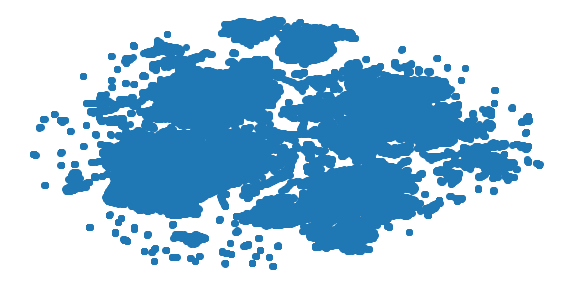

In [31]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results5[:, 0], umap_results5[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

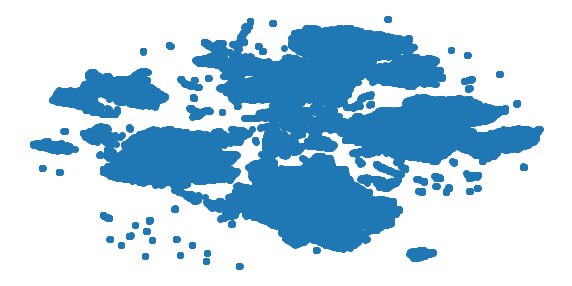

In [32]:
umap_results7 = umap.UMAP(n_neighbors=7,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(umap_results7[:, 0], umap_results7[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

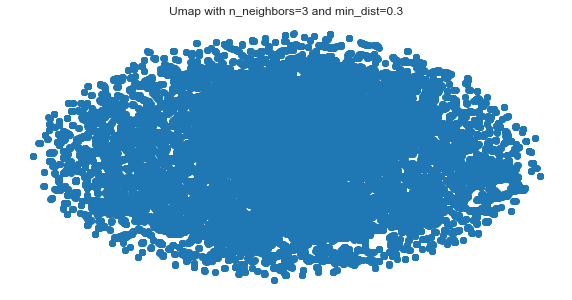

In [33]:
umap_results3 = umap.UMAP(n_neighbors=3,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(10,5))
plt.title("Umap with n_neighbors=3 and min_dist=0.3")
plt.scatter(umap_results3[:, 0], umap_results3[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

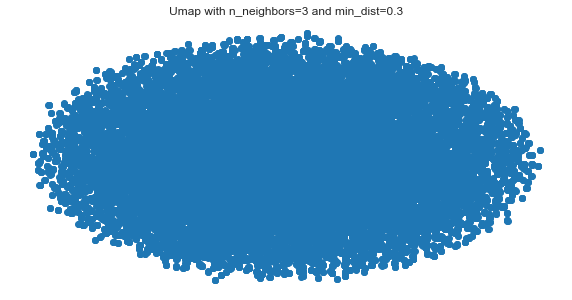

In [34]:
umap_results2 = umap.UMAP(n_neighbors=2,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

plt.figure(figsize=(10,5))
plt.title("Umap with n_neighbors=3 and min_dist=0.3")
plt.scatter(umap_results2[:, 0], umap_results2[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [35]:
time_start = time.time()

umap_results7 = umap.UMAP(n_neighbors=7,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X_std)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 26.172684907913208 seconds


## 6.1. K-Means

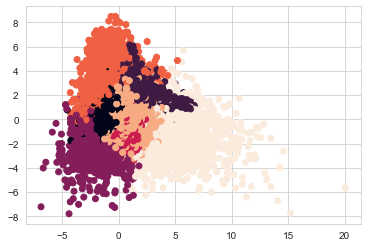

Comparing k-means clusters against the data:
Ut_R   0.000000  0.011494  0.011905  0.012346  0.012821  0.013333  0.013889  \
row_0                                                                         
0         12987         3        10         2         4         4         1   
1           999         0         8         0         1         2         0   
2          2768         0         7         0         0         2         1   
3          6597         6        15         6        10         8         4   
4          2733         3         1         0         2         1         1   
5          4304         1         4         7         4         1         0   
6           394         1         4         0         0         0         3   

Ut_R   0.014493  0.015152  0.015873  ...  0.977273  0.978261  0.980000  \
row_0                                ...                                 
0             2         1         0  ...         0         0         0   
1             0      

In [36]:

# Calculate predicted values.
y_pred = KMeans(n_clusters=7, random_state=123).fit_predict(X_std)

# Plot the solution.
plt.scatter(X_pca[:, 0], X_pca[:, 1],  c=y_pred)
plt.show()


## K-means Evaluation

In [ ]:
# Non-labeled verification:

In [37]:
labels = KMeans(n_clusters=7, random_state=123).fit_predict(X_pca)
print(metrics.silhouette_score(X_pca, labels, metric='euclidean'))

0.37025884005212256


In [38]:
#the score is positive that saying we have a pretty separated clasters. We can compare it with other results

## DBSCAN  (psa)

In [39]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA

In [40]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)
X_pca = PCA(2).fit_transform(X_std)

# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters = dbscan_cluster.fit_predict(X_pca)

In [41]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'

for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters[i]),
             fontdict={'weight': 'bold', 'size': 50}
        )
    
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [42]:
print(metrics.silhouette_score(X_std, clusters, metric='euclidean'))

0.6831208317945591


In [43]:
#The score is much better to use this method. Let's try with UMAP

# Defining the agglomerative clustering
dbscan_cluster = DBSCAN(eps=1, min_samples=5)

# Fit model
clusters_umap = dbscan_cluster.fit_predict(umap_results7)

## DBSCAN  (umap)

In [44]:
print(metrics.silhouette_score(X_std, clusters_umap, metric='euclidean'))

-0.17766774496596768


## Hierarchical clastering (psa)

In [45]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X)
Xpca = PCA(2).fit_transform(X_std)
from sklearn.cluster import AgglomerativeClustering

# Defining the agglomerative clustering
agg_cluster = AgglomerativeClustering(linkage='complete', 
                                      affinity='cosine',
                                      n_clusters=3)

# Fit model
clusters_h = agg_cluster.fit_predict(X_pca)

In [46]:
pca = PCA(n_components=2).fit_transform(X_std)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(pca.shape[0]):
    plt.text(pca[i, 0], pca[i, 1], str(clusters_h[i]),
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [47]:
print(metrics.silhouette_score(X_std, clusters_h, metric='euclidean'))

0.12076635242142303


In [49]:
#The score is much better to use this method. Let's try with UMAP

# Fit model
clusters_h_umap = agg_cluster.fit_predict(umap_results7)

## Hierarchical clastering (umap)

In [50]:
print(metrics.silhouette_score(X_std, clusters_h_umap, metric='euclidean'))

-0.02156010632054958


# CONCLUSION

During unsupervised learning we were able to define **7 clasters** with umap dimensionality reduction techinique. 
However, based on the silhouette score with  the best result is coming from DBSCAN clasterisation using pca technique - 0.68. As the next steps it might be good idea to do a train set with labels and to use ARI score for them.